<a href="https://colab.research.google.com/github/imabari/ehime-covid-bot/blob/main/ehime_main.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# インストール

# 設定

In [ ]:
USER_AGENT = "Mozilla/5.0 (Windows NT 10.0; WOW64; Trident/7.0; rv:11.0) like Gecko"

DOWNLOAD_DIR = "download"
DATA_DIR = "data"

# オープンデータ

In [ ]:
kanja_csv = "https://www.pref.ehime.jp/opendata-catalog/dataset/2174/resource/7072/380008_ehime_covid19_patients.csv"
kensa_csv = "https://www.pref.ehime.jp/opendata-catalog/dataset/2174/resource/7073/380008_ehime_covid19_test_people.csv"

# データラングリング

In [ ]:
import pandas as pd
import requests

In [ ]:
import datetime
import pathlib
import json

In [ ]:
def fetch_file(url, dir="."):

    r = requests.get(url)
    r.raise_for_status()

    p = pathlib.Path(dir, pathlib.PurePath(url).name)
    p.parent.mkdir(parents=True, exist_ok=True)

    with p.open(mode="wb") as fw:
        fw.write(r.content)
    return p

In [ ]:
JST = datetime.timezone(datetime.timedelta(hours=+9), "JST")
dt_now = datetime.datetime.now(JST)

# 検査

In [ ]:
kensa_path = fetch_file(kensa_csv, DOWNLOAD_DIR)
df_inspections_sum = pd.read_csv(kensa_path, index_col="実施_年月日", parse_dates=True).loc[:, "検査実施_人数"]

df_inspections_sum.name = "検査人数"

# 患者

In [ ]:
kanja_path = fetch_file(kanja_csv, DOWNLOAD_DIR)

In [ ]:
# df_kanja = pd.read_csv(kanja_path, index_col="No", parse_dates=["公表_年月日", "発症_年月日"], sep="\t", encoding="cp932")
df_kanja = pd.read_csv(kanja_path, index_col="No", parse_dates=["公表_年月日", "発症_年月日"])

In [ ]:
df_kanja.columns = df_kanja.columns.map(lambda s: s.replace("患者_", ""))

In [ ]:
weeks = ["月", "火", "水", "木", "金", "土", "日"]
df_kanja["曜日"] = df_kanja["公表_年月日"].dt.dayofweek.apply(lambda x: weeks[x])

In [ ]:
df_kanja["退院"] = df_kanja["退院済フラグ"].replace({1: "○", 0: ""}).fillna("")

In [ ]:
patients = df_kanja.loc[:, [ "公表_年月日", "曜日", "居住地", "年代", "性別", "退院"]]

In [ ]:
patients

,公表_年月日,曜日,居住地,年代,性別,退院
No,,,,,,
1,2020-03-02,月,愛南町,40代,女性,
2,2020-03-04,水,松山市,30代,女性,
3,2020-03-18,水,松山市,30代,女性,
4,2020-03-26,木,新居浜市,20代,男性,
5,2020-03-30,月,松山市,70代,男性,
...,...,...,...,...,...,...
927,2021-01-23,土,四国中央市,非公表,非公表,
928,2021-01-23,土,四国中央市,非公表,非公表,
929,2021-01-23,土,西予市,非公表,非公表,


In [ ]:
df_patients_sum = (
    df_kanja["公表_年月日"].value_counts().sort_index().asfreq("D", fill_value=0)
)

df_patients_sum.name = "陽性人数"

In [ ]:
df_kensa = pd.concat([df_inspections_sum, df_patients_sum], axis=1).fillna(0).astype(int)

In [ ]:
df_kensa

,検査人数,陽性人数
2020-02-01,0,0
2020-02-02,0,0
2020-02-03,1,0
2020-02-04,0,0
2020-02-05,0,0
...,...,...
2021-01-19,224,22
2021-01-20,353,17
2021-01-21,2390,25
2021-01-22,320,18


# 可視化

In [ ]:
!pip install japanize-matplotlib

     |████████████████████████████████| 4.1MB 12.9MB/s 
  Created wheel for japanize-matplotlib: filename=japanize_matplotlib-1.1.3-cp36-none-any.whl size=4120276 sha256=0a47bdd8beafd0acb9bf8af41d43df778faa681ab68e94858a19cf9c6982501a
  Stored in directory: /root/.cache/pip/wheels/b7/d9/a2/f907d50b32a2d2008ce5d691d30fb6569c2c93eefcfde55202
Successfully built japanize-matplotlib


In [ ]:
import matplotlib.pyplot as plt

In [ ]:
import japanize_matplotlib
import matplotlib.dates as mdates

In [ ]:
# 解像度
import matplotlib as mpl

mpl.rcParams["figure.dpi"] = 150

## 検査件数

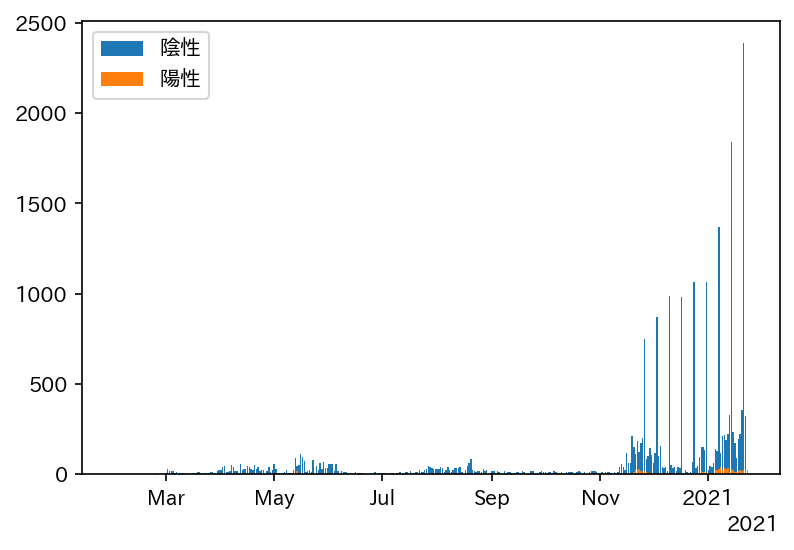

In [ ]:
fig, ax = plt.subplots()

locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)
ax.xaxis.set_major_locator(locator)
ax.xaxis.set_major_formatter(formatter)

ax.bar(df_kensa.index, df_kensa["検査人数"])
ax.bar(df_kensa.index, df_kensa["陽性人数"])
ax.legend(["陰性", "陽性"])

# グラフを保存
plt.savefig("01_kensa.png", dpi=200, bbox_inches="tight")
plt.show()

## 陽性患者

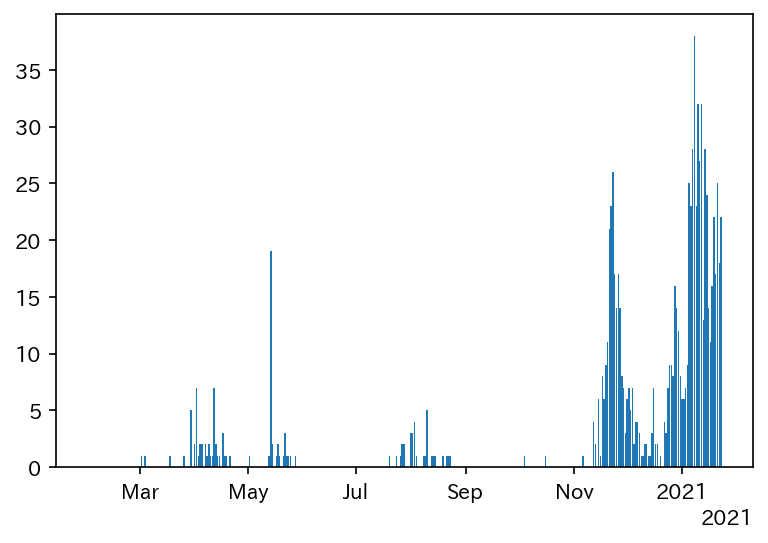

In [ ]:
fig, ax = plt.subplots()

locator = mdates.AutoDateLocator()
formatter = mdates.ConciseDateFormatter(locator)
ax.xaxis.set_major_locator(locator)
ax.xaxis.set_major_formatter(formatter)

ax.bar(df_kensa.index, df_kensa["陽性人数"])

# グラフを保存
plt.savefig("02_yousei.png", dpi=200, bbox_inches="tight")
plt.show()

In [ ]:
patients

,公表_年月日,曜日,居住地,年代,性別,退院
No,,,,,,
1,2020-03-02,月,愛南町,40代,女性,
2,2020-03-04,水,松山市,30代,女性,
3,2020-03-18,水,松山市,30代,女性,
4,2020-03-26,木,新居浜市,20代,男性,
5,2020-03-30,月,松山市,70代,男性,
...,...,...,...,...,...,...
927,2021-01-23,土,四国中央市,非公表,非公表,
928,2021-01-23,土,四国中央市,非公表,非公表,
929,2021-01-23,土,西予市,非公表,非公表,


## 居住地別

In [ ]:
df_area = pd.crosstab(df_kanja["公表_年月日"], df_kanja["居住地"]).reindex(df_kensa.index, fill_value=0)
df_area

居住地,その他,上島町,中予地域,今治市,伊予市,伊方町,八幡浜市,兵庫県,内子町,四国中央市,大洲市,宇和島市,広島県,愛南町,新居浜市,東予地域,東京都,東温市,松前町,松山市,県外,砥部町,神奈川県,福岡県,西予市,西条市,非公表,香川県,鬼北町
2020-02-01,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-02-02,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-02-03,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-02-04,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2020-02-05,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-01-19,0,0,0,3,1,0,0,0,0,4,1,0,0,0,0,0,0,0,0,12,0,0,0,0,1,0,0,0,0
2021-01-20,0,0,0,0,0,0,0,0,2,4,0,0,0,0,2,0,0,0,0,9,0,0,0,0,0,0,0,0,0
2021-01-21,0,0,0,2,0,0,0,0,0,6,0,0,0,0,0,0,0,0,0,16,0,0,0,0,0,0,0,1,0
2021-01-22,0,0,0,1,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,12,0,1,0,0,0,1,0,0,0


## 居住地別（全期間）

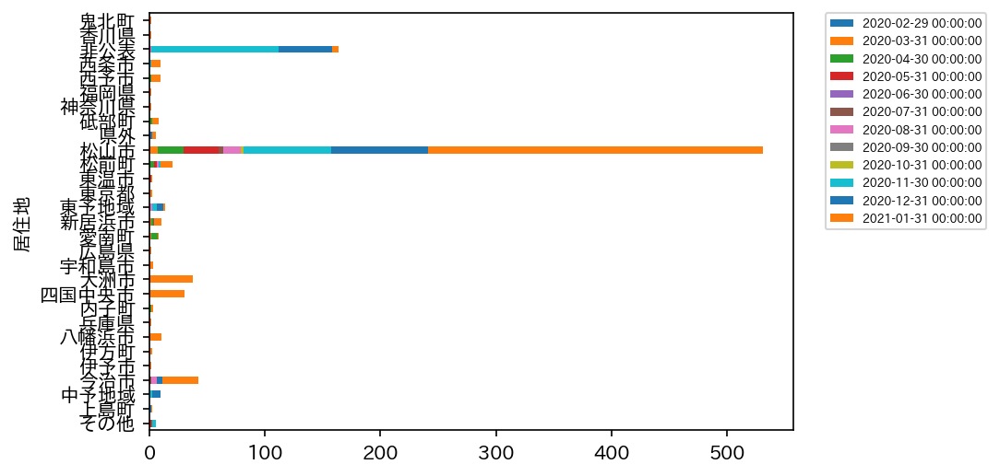

In [ ]:
df_area.resample("M").sum().T.plot.barh(stacked=True)
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0, fontsize=6)

# グラフを保存
plt.savefig("03_area.png", dpi=200, bbox_inches="tight")
plt.show()

## 居住地別（直近14日）

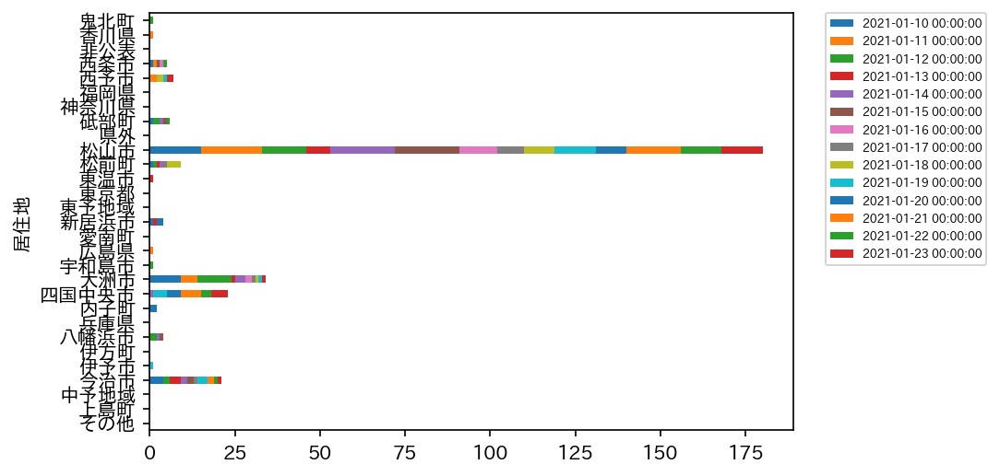

In [ ]:
df_area.tail(14).T.plot.barh(stacked=True)
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0, fontsize=6)

# グラフを保存
plt.savefig("04_area_7day.png", dpi=200, bbox_inches="tight")
plt.show()

## 年代別

In [ ]:
age_list = ["10歳未満","10代", "20代", "30代", "40代", "50代", "60代", "70代", "80代", "90歳以上", "非公表"]

In [ ]:
df_age = pd.crosstab(patients["年代"], patients["性別"]).reindex(index= age_list, columns = ["男性", "女性"], fill_value=0)

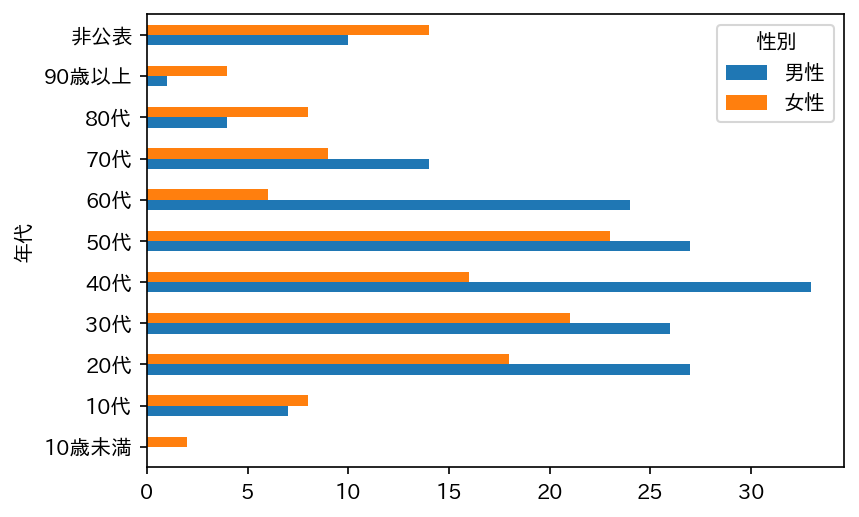

In [ ]:
df_age.plot.barh()

# グラフを保存
plt.savefig("05_age.png", dpi=200, bbox_inches="tight")
plt.show()

## 性別

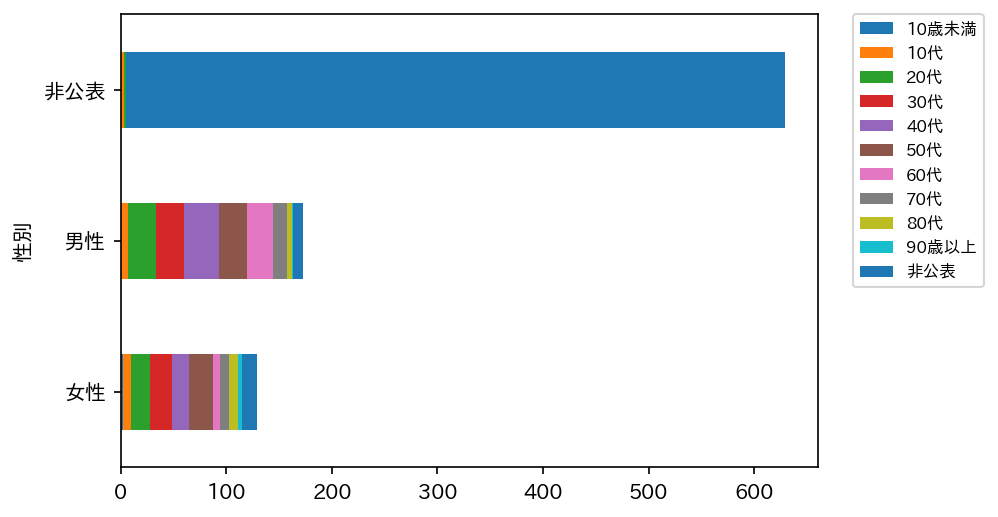

In [ ]:
df_gender = pd.crosstab(patients["性別"], patients["年代"]).reindex(
    columns=age_list, fill_value=0
)
df_gender.plot.barh(stacked=True)
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", borderaxespad=0, fontsize=8)

# グラフを保存
plt.savefig("06_gender.png", dpi=200, bbox_inches="tight")
plt.show()

## 陽性率

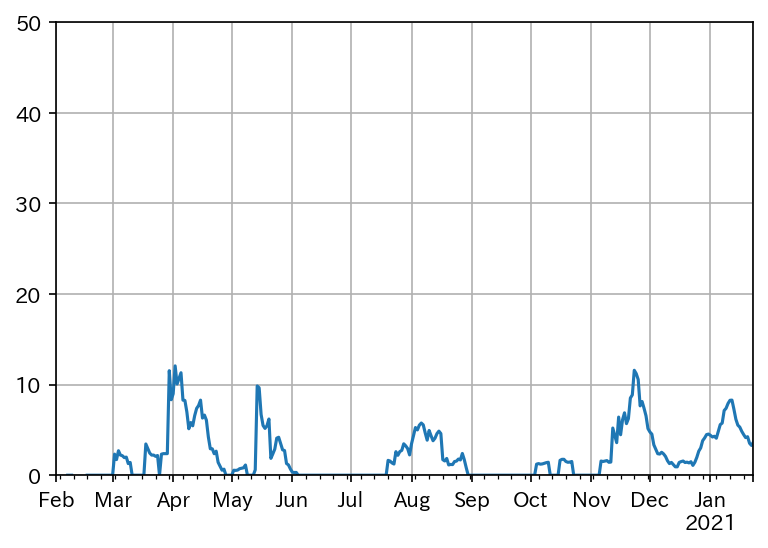

In [ ]:
# 7日間平均
df_positive_7d = df_kensa.rolling(window=7).mean()
df_positive_7d["陽性率"] = df_positive_7d["陽性人数"] / df_positive_7d["検査人数"] * 100
df_positive_7d["陽性率"].plot(ylim=(0, 50), grid=True)

# グラフを保存
plt.savefig("07_positive.png", dpi=200, bbox_inches="tight")
plt.show()

## 実効再生産数

In [ ]:
import numpy as np

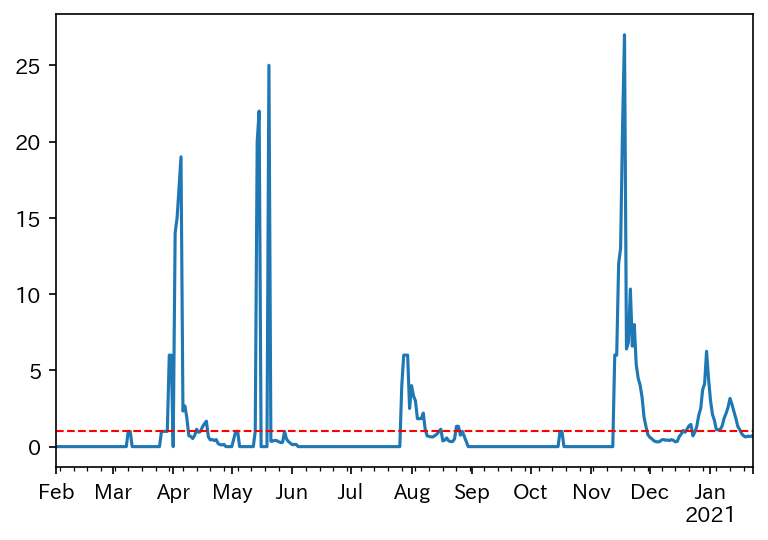

In [ ]:
# 直近７日間の患者数
this_week = df_kensa["陽性人数"].rolling(window=7).sum().fillna(0)

# その前７日間の患者数
last_week = this_week.shift(7, fill_value=0)

K = (this_week / last_week).replace([np.inf, -np.inf], np.nan)
K.fillna(0, inplace=True)

ax = K.plot()
ax.axhline(y=1, linestyle="--", color="red", linewidth = 1, label="")

In [ ]:
ddd = pd.DataFrame({"今週":this_week, "先週":last_week, "K":K})

In [ ]:
ddd

,今週,先週,K
2020-02-01,0.0,0.0,0.000000
2020-02-02,0.0,0.0,0.000000
2020-02-03,0.0,0.0,0.000000
2020-02-04,0.0,0.0,0.000000
2020-02-05,0.0,0.0,0.000000
...,...,...,...
2021-01-19,128.0,203.0,0.630542
2021-01-20,132.0,193.0,0.683938
2021-01-21,129.0,193.0,0.668394
2021-01-22,123.0,179.0,0.687151


## 地図

In [ ]:
!pip install folium
!wget "https://github.com/niiyz/JapanCityGeoJson/raw/master/geojson/prefectures/38.json" -O 38.json

--2021-01-24 02:49:30--  https://github.com/niiyz/JapanCityGeoJson/raw/master/geojson/prefectures/38.json
Resolving github.com (github.com)... 140.82.121.3
Connecting to github.com (github.com)|140.82.121.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/niiyz/JapanCityGeoJson/master/geojson/prefectures/38.json [following]
--2021-01-24 02:49:30--  https://raw.githubusercontent.com/niiyz/JapanCityGeoJson/master/geojson/prefectures/38.json
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 12751020 (12M) [text/plain]
Saving to: ‘38.json’

38.json             100%[===================>]  12.16M  53.0MB/s    in 0.2s    

2021-01-24 02:49:31 (53.0 MB/s) - ‘38.json’ saved [12751020/12751020]



In [ ]:
df_map = df_kanja["居住地"].value_counts().reset_index().rename(columns={"index": "市町村", "居住地": "人数"})
df_map

,市町村,人数
0,松山市,531
1,非公表,164
2,今治市,42
3,大洲市,37
4,四国中央市,30
5,松前町,20
6,東予地域,13
7,八幡浜市,10
8,新居浜市,10
9,西予市,9


In [ ]:
ehime_names = {
    38201: "松山市",
    38202: "今治市",
    38203: "宇和島市",
    38204: "八幡浜市",
    38205: "新居浜市",
    38206: "西条市",
    38207: "大洲市",
    38210: "伊予市",
    38213: "四国中央市",
    38214: "西予市",
    38215: "東温市",
    38356: "上島町",
    38386: "久万高原町",
    38401: "松前町",
    38402: "砥部町",
    38422: "内子町",
    38442: "伊方町",
    38484: "松野町",
    38488: "鬼北町",
    38506: "愛南町",
}

ehime_codes = {v.rstrip("県市町"): k for k, v in ehime_names.items()}

In [ ]:
df_map["コード"] = df_map["市町村"].apply(lambda x: str(ehime_codes.get(x.rstrip("県市町"), 0)))

In [ ]:
df_map

,市町村,人数,コード
0,松山市,531,38201
1,非公表,164,0
2,今治市,42,38202
3,大洲市,37,38207
4,四国中央市,30,38213
5,松前町,20,38401
6,東予地域,13,0
7,八幡浜市,10,38204
8,新居浜市,10,38205
9,西予市,9,38214


In [ ]:
import folium
import json

m = folium.Map(
    location=[33.841672, 132.765339],
    tiles="https://cyberjapandata.gsi.go.jp/xyz/blank/{z}/{x}/{y}.png",
    attr="国土地理院 白地図",
    zoom_start=9,
)

geojson = "38.json"

folium.Choropleth(
    geo_data=geojson,
    data=df_map,
    columns=["コード", "人数"],
    threshold_scale=[0, 5, 10, 20, 50, 100, 200, 999],
    key_on="id",
    fill_color="OrRd",
).add_to(m)

m.save(outfile="map.html")

m